# Use load_h5_data1:
goolam, worm_neuron_cell, yan, Melanoma_5K, petropoulos, Pollen, Bach, Tosches, Shekhar, hrvatin

# Use load_h5_data2:
Young, Quake_10x_Bladder, Quake_10x_Limb_Muscle, Quake_Smart-seq2_Diaphragm, Muraro

In [30]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
%cd "/content/drive/My Drive/ĐACN-ĐATN/scAGCL"

/content/drive/.shortcut-targets-by-id/1Yyegb_H3iCVMz5HbTDBdw5EXiZ-1I708/ĐACN-ĐATN/scAGCL


# Setup environment and library

In [3]:
!pip install torch-scatter -f https://data.pyg.org/whl/torch-2.8.0+cu126.html

Looking in links: https://data.pyg.org/whl/torch-2.8.0+cu126.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 99.1 MB/s eta 0:00:00


In [4]:
!pip install h5py networkx numpy pandas scikit-learn scipy scanpy torch torch-geometric torchaudio torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 62.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.3/169.3 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.0/80.0 kB 10.0 MB/s eta 0:00:00


# Visualization

## Draw the K-NN graph

In [ ]:
import sys
sys.path.append('./scAGCL')

import argparse
import random
import numpy as np
import torch
import pandas as pd
from torch_geometric.data import Data
from model import Encoder, AGCLModel
from utils import load_h5_data1, load_h5_data2, GraphConstruction
from train import Train
from sklearn.cluster import KMeans
from sklearn.metrics import (adjusted_rand_score,  normalized_mutual_info_score)
from sklearn.preprocessing import normalize
import networkx as nx
import matplotlib.pyplot as plt

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [ ]:
def draw_knn(data_file, num_cluster):
  # Read input data
  data_path='./data/' + data_file
  X, Y = load_h5_data1(data_path)   # h5 file has X and Y field
  #X, Y = load_h5_data2(data_path)   #h5 file in which X in "exprs" and Y in "obs" field

  data = Data(x=torch.from_numpy(X))
  cellGraph=GraphConstruction(data, X, num_cluster)

  # Vẽ đồ thị spring_layout
  plt.figure(figsize=(6, 6))
  pos = nx.spring_layout(cellGraph, seed=42)   # chọn cách bố trí (layout)
  nx.draw(cellGraph, pos, with_labels=True, node_color="lightblue", edge_color="gray", node_size=800, font_size=12)
  plt.show()

  print('---------------------------------------------')

  # Vẽ đồ thị spectral_layout
  plt.figure(figsize=(6, 6))
  pos = nx.spectral_layout(cellGraph)   # chọn cách bố trí (layout)
  nx.draw(cellGraph, pos, with_labels=True, node_color="lightblue", edge_color="gray", node_size=800, font_size=12)
  plt.show()

## Analyze the structure of K-NN graph built from data

In [ ]:
def analyze_knn_structure(data_file, num_cluster):
  # Read input data
  data_path='./data/' + data_file
  X, Y = load_h5_data1(data_path)   # h5 file has X and Y field
  #X, Y = load_h5_data2(data_path)   #h5 file in which X in "exprs" and Y in "obs" field

  data = Data(x=torch.from_numpy(X))
  cellGraph=GraphConstruction(data, X, num_cluster)

  # Degree Distribution
  hist = nx.degree_histogram(cellGraph)
  plt.figure(figsize=(10, 6))
  plt.bar(range(len(hist)), hist)
  plt.title(f"Phân phối Bậc của Đồ thị K-NN từ {data_file}")
  plt.xlabel("Bậc của Nút (Degree)")
  plt.ylabel("Số lượng Nút")
  plt.xlim(0, 40) # Giới hạn trục x để nhìn rõ hơn
  plt.grid(axis='y', alpha=0.75)
  plt.show()

  # Clustering Coefficient
  clust_coeff = nx.average_clustering(cellGraph)
  print(f"Hệ số phân cụm của đồ thị K-NN từ {data_file}: {clust_coeff}")

  # Connected Components
  num_components = nx.number_connected_components(cellGraph)
  print(f"Số lượng thành phần liên thông trong đồ thị K-NN từ {data_file}: {num_components}")

  # Bridges and Articulation Points
  bridges = list(nx.bridges(cellGraph))
  articulation_points = list(nx.articulation_points(cellGraph))
  print(f"Số lượng cầu nối trong đồ thị K-NN từ {data_file}: {len(bridges)}")
  print(f"Số lượng điểm cắt trong đồ thị K-NN từ {data_file}: {len(articulation_points)}")

# Run scAGCL on datasets

### Bach

In [ ]:
draw_knn('Bach.h5', 8)

Reading data!
There are 23184 cells, 19965 genes
Keeping 2000 genes
Number of neighbors (k) in k-nn graph:  15


In [ ]:
analyze_knn_structure('Bach.h5', 8)

NameError: name 'analyze_knn_structure' is not defined

In [ ]:
# Bach
!python scAGCL.py --data_file Bach.h5 --num_cluster 8 --lam 1 --random_seed 1 --num_epochs 100

Traceback (most recent call last):
  File "/content/drive/MyDrive/ĐACN-ĐATN/scAGCL/scAGCL.py", line 6, in <module>
  File "/usr/local/lib/python3.12/dist-packages/torch_geometric/__init__.py", line 16, in <module>
    import torch_geometric.utils
  File "/usr/local/lib/python3.12/dist-packages/torch_geometric/utils/__init__.py", line 58, in <module>
    from .ppr import get_ppr
  File "/usr/local/lib/python3.12/dist-packages/torch_geometric/utils/ppr.py", line 12, in <module>
    import numba
  File "/usr/local/lib/python3.12/dist-packages/numba/__init__.py", line 73, in <module>
    from numba.core import config
  File "/usr/local/lib/python3.12/dist-packages/numba/core/config.py", line 11, in <module>
    import yaml
  File "/usr/local/lib/python3.12/dist-packages/yaml/__init__.py", line 8, in <module>
    from .loader import *
  File "/usr/local/lib/python3.12/dist-packages/yaml/loader.py", line 4, in <module>
    from .reader import *
  File "/usr/local/lib/python3.12/dist-packages

### Shekhar

In [ ]:
draw_knn('Shekhar.h5', 18)

Reading data!
There are 26830 cells, 13166 genes
Keeping 2000 genes
Number of neighbors (k) in k-nn graph:  15


In [ ]:
analyze_knn_structure('Shekhar.h5', 18)

In [ ]:
# Shekhar
!python scAGCL.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 1 --num_epochs 100

Reading data!
There are 26830 cells, 13166 genes
Keeping 2000 genes
Number of neighbors (k) in k-nn graph:  15
^C


In [ ]:
# Shekhar
!python run.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 1 --num_epochs 500

2025-10-14 16:37:16.985050: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760459837.004701   15896 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760459837.010658   15896 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760459837.026161   15896 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459837.026193   15896 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459837.026197   15896 computation_placer.cc:177] computation placer alr

In [ ]:
# Shekhar
!python run.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 12 --num_epochs 500

2025-10-14 16:37:29.014079: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760459849.033618   15956 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760459849.039688   15956 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760459849.054328   15956 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459849.054352   15956 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459849.054355   15956 computation_placer.cc:177] computation placer alr

In [ ]:
# Shekhar
!python run.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 123--num_epochs 500

2025-10-14 16:37:41.172043: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760459861.195634   16014 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760459861.205524   16014 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760459861.224674   16014 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459861.224701   16014 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459861.224707   16014 computation_placer.cc:177] computation placer alr

In [ ]:
# Shekhar
!python run.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 1234 --num_epochs 500

2025-10-14 16:37:53.441381: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760459873.460719   16072 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760459873.466518   16072 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760459873.481115   16072 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459873.481141   16072 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459873.481145   16072 computation_placer.cc:177] computation placer alr

In [ ]:
# Shekhar
!python run.py --data_file Shekhar.h5 --num_cluster 18 --lam 1 --random_seed 12345 --num_epochs 500

2025-10-14 16:38:05.620900: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760459885.640396   16132 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760459885.646314   16132 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760459885.660915   16132 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459885.660940   16132 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760459885.660944   16132 computation_placer.cc:177] computation placer alr

### Quake_10x_Bladder

Reading data!
There are 2500 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  2500
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.27210488 0.34146404 0.53009563 ... 0.66780414 0.60066841 0.19896793]
Length of Pearson distance before squareform:  3123750
Pearson distance matrix:  [[0.         0.27210488 0.34146404 ... 0.39309118 0.63775458 0.60343136]
 [0.27210488 0.         0.2143164  ... 0.24812497 0.64854781 0.6037651 ]
 [0.34146404 0.2143164  0.         ... 0.20540506 0.64191114 0.58677631]
 ...
 [0.39309118 0.24812497 0.20540506 ... 0.         0.66780414 0.60066841]
 [0.63775458 0.64854781 0.64191114 ... 0.66780414 0.         0.19896793]
 [0.60343136 0.6037651  0.58677631 ... 0.60066841 0.19896793 0.        ]]
Pearson distance matrix dimensions:  (2500, 2500)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2500 nodes and 33398 edges


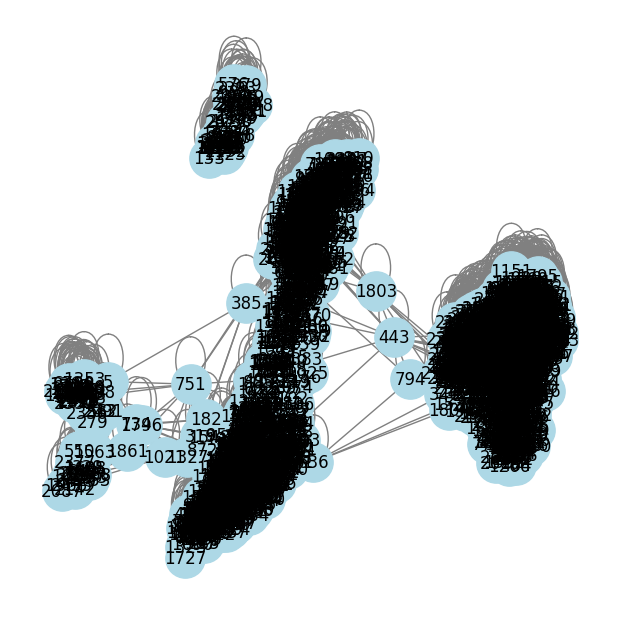

---------------------------------------------


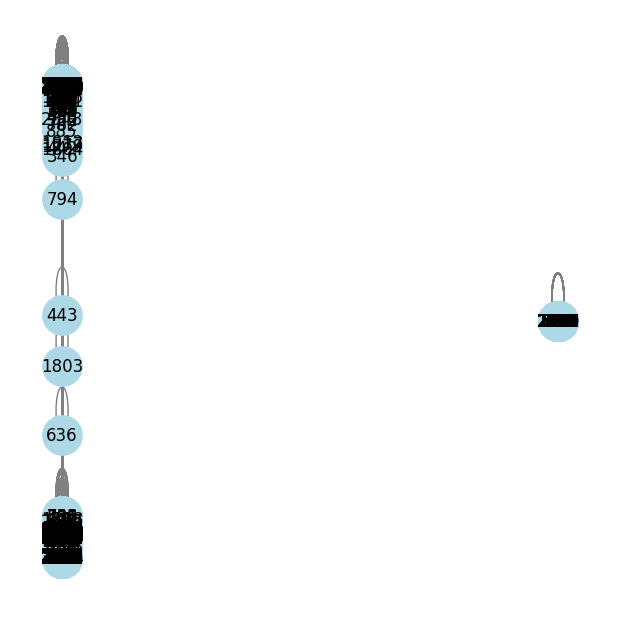

In [ ]:
draw_knn('Quake_10x_Bladder.h5', 4)

Reading data!
There are 2500 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  2500
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.27210488 0.34146404 0.53009563 ... 0.66780414 0.60066841 0.19896793]
Length of Pearson distance before squareform:  3123750
Pearson distance matrix:  [[0.         0.27210488 0.34146404 ... 0.39309118 0.63775458 0.60343136]
 [0.27210488 0.         0.2143164  ... 0.24812497 0.64854781 0.6037651 ]
 [0.34146404 0.2143164  0.         ... 0.20540506 0.64191114 0.58677631]
 ...
 [0.39309118 0.24812497 0.20540506 ... 0.         0.66780414 0.60066841]
 [0.63775458 0.64854781 0.64191114 ... 0.66780414 0.         0.19896793]
 [0.60343136 0.6037651  0.58677631 ... 0.60066841 0.19896793 0.        ]]
Pearson distance matrix dimensions:  (2500, 2500)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2500 nodes and 33398 edges


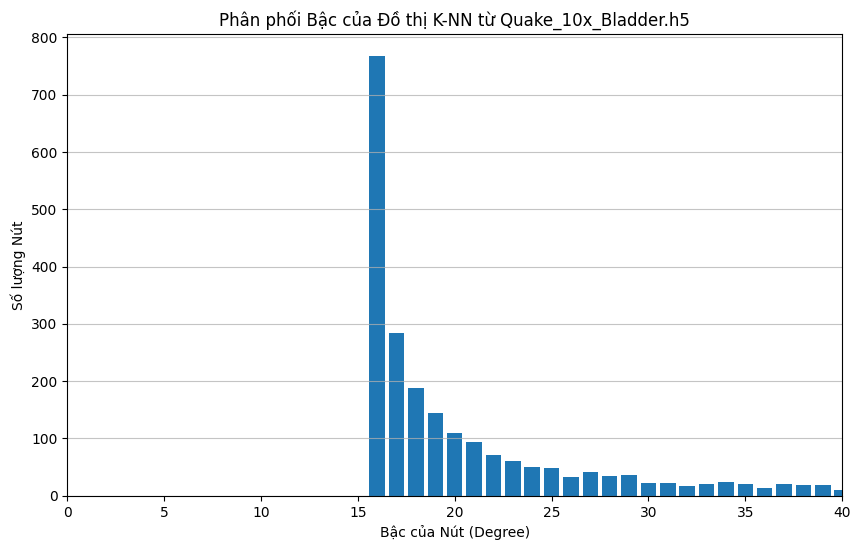

Hệ số phân cụm của đồ thị K-NN từ Quake_10x_Bladder.h5: 0.36363295310682486
Số lượng thành phần liên thông trong đồ thị K-NN từ Quake_10x_Bladder.h5: 2
Số lượng cầu nối trong đồ thị K-NN từ Quake_10x_Bladder.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Quake_10x_Bladder.h5: 0


In [ ]:
analyze_knn_structure('Quake_10x_Bladder.h5', 4)

In [ ]:
# Quake_10x_Bladder
!python scAGCL.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 1 --num_epochs 100

Reading data!
There are 2500 cells, 23341 genes
Keeping 2000 genes
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.27210488 0.34146404 0.53009563 ... 0.66780414 0.60066841 0.19896793]
Length of Pearson distance before squareform:  3123750
Pearson distance matrix:  [[0.         0.27210488 0.34146404 ... 0.39309118 0.63775458 0.60343136]
 [0.27210488 0.         0.2143164  ... 0.24812497 0.64854781 0.6037651 ]
 [0.34146404 0.2143164  0.         ... 0.20540506 0.64191114 0.58677631]
 ...
 [0.39309118 0.24812497 0.20540506 ... 0.         0.66780414 0.60066841]
 [0.63775458 0.64854781 0.64191114 ... 0.66780414 0.         0.19896793]
 [0.60343136 0.6037651  0.58677631 ... 0.60066841 0.19896793 0.        ]]
Pearson distance matrix dimensions:  (2500, 2500)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2500 nodes and 33398 edges
Epoch=020, loss1=5.9921, loss2=6.6822, total loss=12.6743, total time 61.6990
Epoch=040, loss1=6.0011

In [ ]:
# Quake_10x_Bladder
!python run.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:14:59.333246: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760955299.352635   24630 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Bladder
!python run.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:19:12.447714: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760955552.479037   25732 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Bladder
!python run.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:22:48.285529: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760955768.306001   26664 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Bladder
!python run.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:26:22.000091: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760955982.022229   27595 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Bladder
!python run.py --data_file Quake_10x_Bladder.h5 --num_cluster 4 --lam 1 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:29:57.010864: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760956197.042902   28534 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

### Quake_10x_Diaphragm

Reading data!
There are 870 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  870
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.77549352 0.82284607 0.90896733 ... 0.57602065 0.95851371 0.94846268]
Length of Pearson distance before squareform:  378015
Pearson distance matrix:  [[0.         0.77549352 0.82284607 ... 0.91434366 0.84112251 0.84205326]
 [0.77549352 0.         0.44305502 ... 0.89274742 0.87911091 0.92121869]
 [0.82284607 0.44305502 0.         ... 0.85625958 0.88532084 0.9460497 ]
 ...
 [0.91434366 0.89274742 0.85625958 ... 0.         0.57602065 0.95851371]
 [0.84112251 0.87911091 0.88532084 ... 0.57602065 0.         0.94846268]
 [0.84205326 0.92121869 0.9460497  ... 0.95851371 0.94846268 0.        ]]
Pearson distance matrix dimensions:  (870, 870)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 870 nodes and 10738 edges


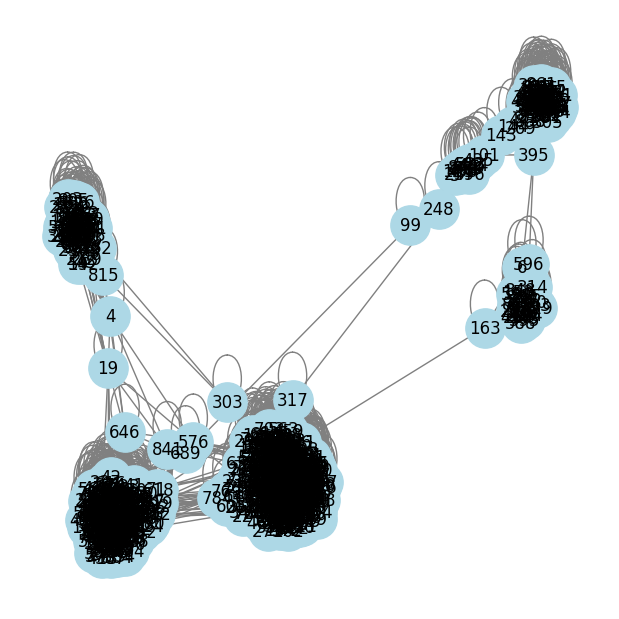

---------------------------------------------


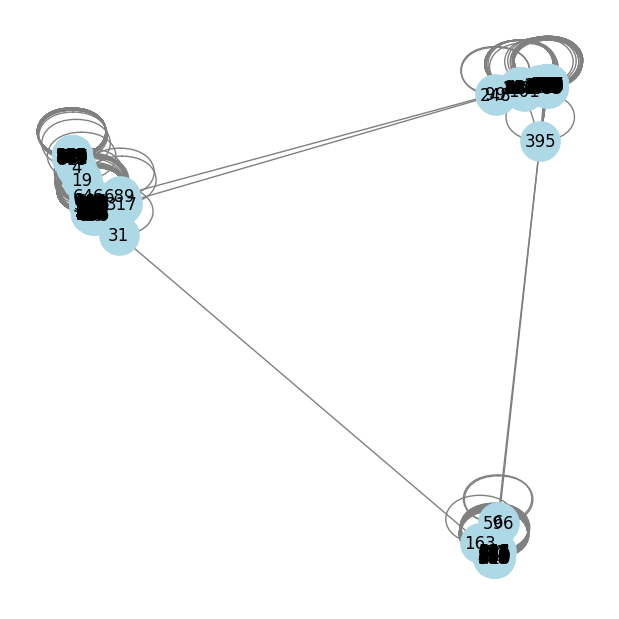

In [ ]:
draw_knn('Quake_Smart-seq2_Diaphragm.h5', 5)

Reading data!
There are 870 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  870
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.77549352 0.82284607 0.90896733 ... 0.57602065 0.95851371 0.94846268]
Length of Pearson distance before squareform:  378015
Pearson distance matrix:  [[0.         0.77549352 0.82284607 ... 0.91434366 0.84112251 0.84205326]
 [0.77549352 0.         0.44305502 ... 0.89274742 0.87911091 0.92121869]
 [0.82284607 0.44305502 0.         ... 0.85625958 0.88532084 0.9460497 ]
 ...
 [0.91434366 0.89274742 0.85625958 ... 0.         0.57602065 0.95851371]
 [0.84112251 0.87911091 0.88532084 ... 0.57602065 0.         0.94846268]
 [0.84205326 0.92121869 0.9460497  ... 0.95851371 0.94846268 0.        ]]
Pearson distance matrix dimensions:  (870, 870)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 870 nodes and 10738 edges


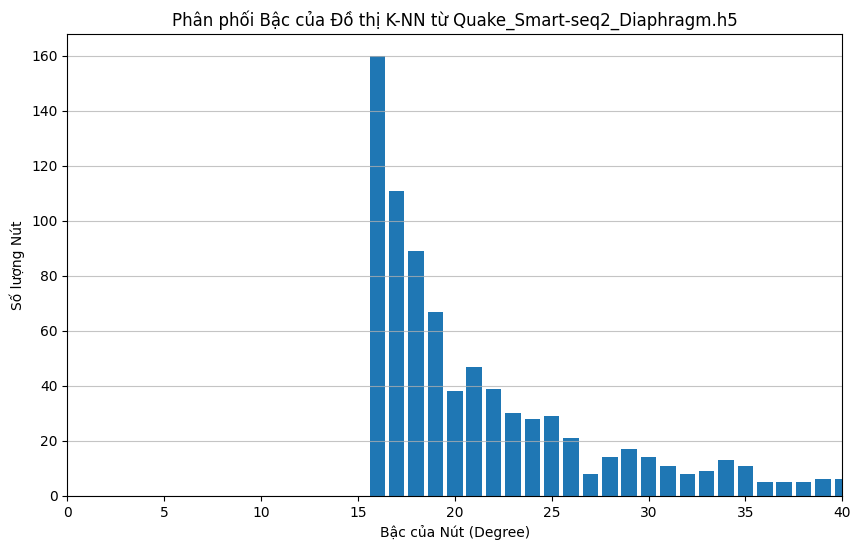

Hệ số phân cụm của đồ thị K-NN từ Quake_Smart-seq2_Diaphragm.h5: 0.3086825057327249
Số lượng thành phần liên thông trong đồ thị K-NN từ Quake_Smart-seq2_Diaphragm.h5: 1
Số lượng cầu nối trong đồ thị K-NN từ Quake_Smart-seq2_Diaphragm.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Quake_Smart-seq2_Diaphragm.h5: 0


In [ ]:
analyze_knn_structure('Quake_Smart-seq2_Diaphragm.h5', 5)

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python scAGCL.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 100

Reading data!
There are 870 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  870
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.77549352 0.82284607 0.90896733 ... 0.57602065 0.95851371 0.94846268]
Length of Pearson distance before squareform:  378015
Pearson distance matrix:  [[0.         0.77549352 0.82284607 ... 0.91434366 0.84112251 0.84205326]
 [0.77549352 0.         0.44305502 ... 0.89274742 0.87911091 0.92121869]
 [0.82284607 0.44305502 0.         ... 0.85625958 0.88532084 0.9460497 ]
 ...
 [0.91434366 0.89274742 0.85625958 ... 0.         0.57602065 0.95851371]
 [0.84112251 0.87911091 0.88532084 ... 0.57602065 0.         0.94846268]
 [0.84205326 0.92121869 0.9460497  ... 0.95851371 0.94846268 0.        ]]
Pearson distance matrix dimensions:  (870, 870)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 870 nodes and 10738 edges
Epoch=020, loss1=5.7892, loss2=6.3182, total loss=12.

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python run.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:36:44.618052: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760956604.637367   30296 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python run.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:39:58.101672: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760956798.121143   31129 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python run.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:43:09.874004: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760956989.892980   31967 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python run.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:46:23.797899: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760957183.816750   32811 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_Smart-seq2_Diaphragm.h5
!python run.py --data_file Quake_Smart-seq2_Diaphragm.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:49:37.848041: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760957377.867682   33650 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

### Goolam

Reading data!
There are 124 cells, 41480 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  124
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.05299131 0.07215001 0.07484139 ... 0.10414226 0.1256009  0.10549375]
Length of Pearson distance before squareform:  7626
Pearson distance matrix:  [[0.         0.05299131 0.07215001 ... 0.27338891 0.24730078 0.23685349]
 [0.05299131 0.         0.0747699  ... 0.27354682 0.25174163 0.23644609]
 [0.07215001 0.0747699  0.         ... 0.25533265 0.22757495 0.2258479 ]
 ...
 [0.27338891 0.27354682 0.25533265 ... 0.         0.10414226 0.1256009 ]
 [0.24730078 0.25174163 0.22757495 ... 0.10414226 0.         0.10549375]
 [0.23685349 0.23644609 0.2258479  ... 0.1256009  0.10549375 0.        ]]
Pearson distance matrix dimensions:  (124, 124)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 124 nodes and 458 edges


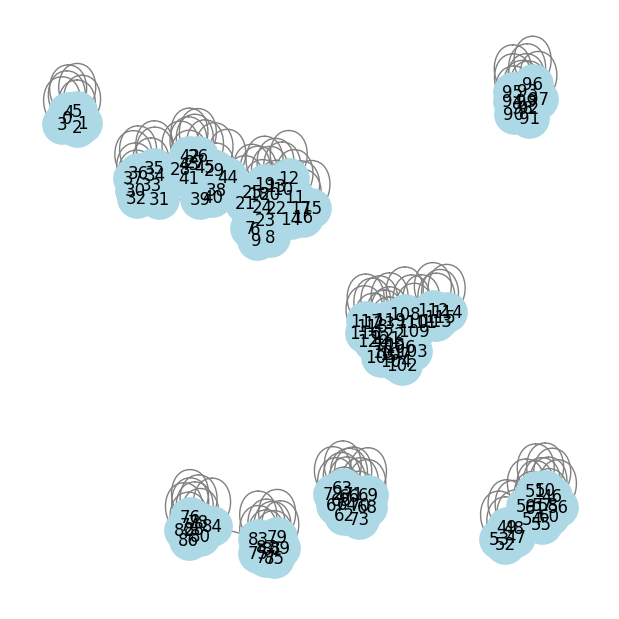

---------------------------------------------


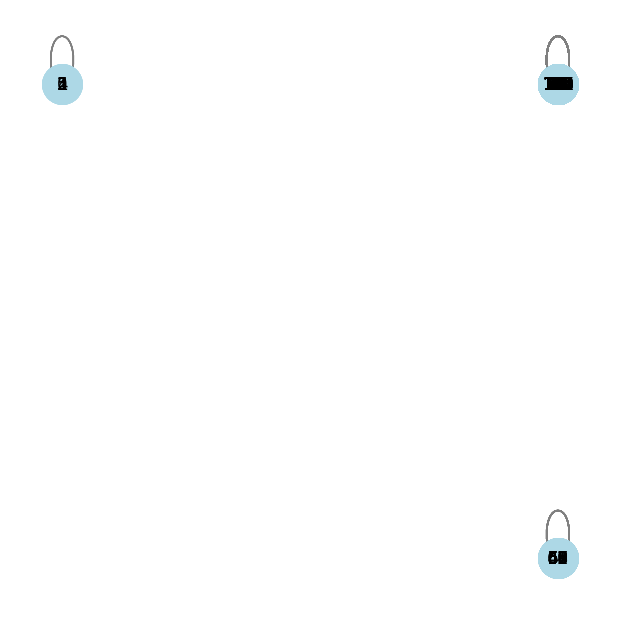

In [ ]:
draw_knn('goolam.h5', 5)

Reading data!
There are 124 cells, 41480 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  124
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.05299131 0.07215001 0.07484139 ... 0.10414226 0.1256009  0.10549375]
Length of Pearson distance before squareform:  7626
Pearson distance matrix:  [[0.         0.05299131 0.07215001 ... 0.27338891 0.24730078 0.23685349]
 [0.05299131 0.         0.0747699  ... 0.27354682 0.25174163 0.23644609]
 [0.07215001 0.0747699  0.         ... 0.25533265 0.22757495 0.2258479 ]
 ...
 [0.27338891 0.27354682 0.25533265 ... 0.         0.10414226 0.1256009 ]
 [0.24730078 0.25174163 0.22757495 ... 0.10414226 0.         0.10549375]
 [0.23685349 0.23644609 0.2258479  ... 0.1256009  0.10549375 0.        ]]
Pearson distance matrix dimensions:  (124, 124)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 124 nodes and 458 edges


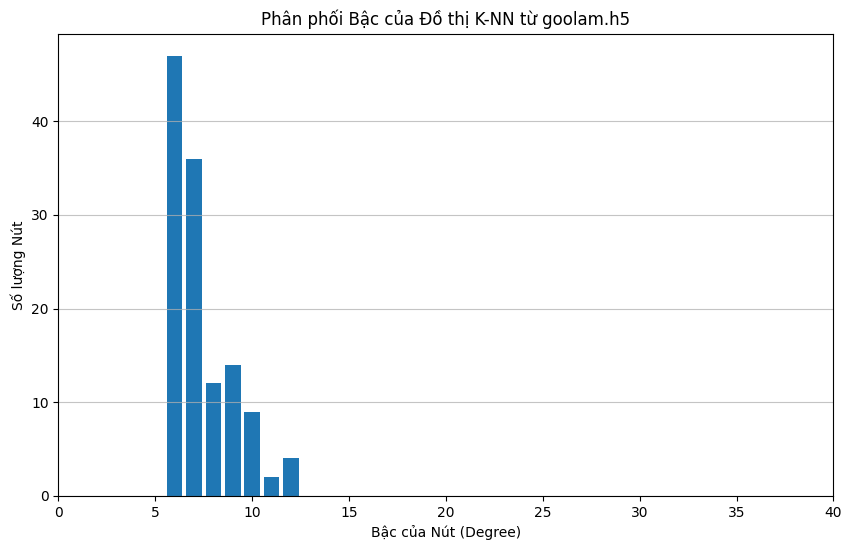

Hệ số phân cụm của đồ thị K-NN từ goolam.h5: 0.5923003072196621
Số lượng thành phần liên thông trong đồ thị K-NN từ goolam.h5: 7
Số lượng cầu nối trong đồ thị K-NN từ goolam.h5: 1
Số lượng điểm cắt trong đồ thị K-NN từ goolam.h5: 2


In [ ]:
analyze_knn_structure('goolam.h5', 5)

In [15]:
# goolam
!python scAGCL.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 14:51:27.818455: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760971887.838280    9961 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [16]:
# goolam
!python scAGCL.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 14:53:31.157471: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760972011.177262   10491 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [17]:
# goolam
!python scAGCL.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 14:55:31.920584: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760972131.940268   11001 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [18]:
# goolam
!python scAGCL.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 14:57:33.550533: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760972253.582967   11511 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [19]:
# goolam
!python scAGCL.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 14:59:35.847770: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760972375.867147   12025 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [68]:
# goolam
%pdb on

!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --learning_rate 0.0005 --random_seed 1 --num_epochs 500

Automatic pdb calling has been turned ON
/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:00:24.001800: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760983224.021591   58265 cuda_dnn.cc:8579] Unable to register cuDNN factory: 

In [69]:
# goolam
%pdb on

!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --learning_rate 0.0005 --random_seed 12 --num_epochs 500

Automatic pdb calling has been turned ON
/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:02:54.416535: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760983374.435891   58926 cuda_dnn.cc:8579] Unable to register cuDNN factory: 

In [70]:
# goolam
%pdb on

!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --learning_rate 0.0005 --random_seed 123 --num_epochs 500

Automatic pdb calling has been turned ON
/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:05:22.482528: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760983522.503441   59577 cuda_dnn.cc:8579] Unable to register cuDNN factory: 

In [71]:
# goolam
%pdb on

!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --learning_rate 0.0005 --random_seed 1234 --num_epochs 500

Automatic pdb calling has been turned ON
/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:07:50.676070: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760983670.707667   60226 cuda_dnn.cc:8579] Unable to register cuDNN factory: 

In [72]:
# goolam
%pdb on

!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --learning_rate 0.0005 --random_seed 12345 --num_epochs 500

Automatic pdb calling has been turned ON
/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:10:22.680523: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760983822.700678   60889 cuda_dnn.cc:8579] Unable to register cuDNN factory: 

### Limb_Muscle

Reading data!
There are 3909 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  3909
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.54975045 0.79793086 0.86456692 ... 0.29354588 0.59195092 0.48205144]
Length of Pearson distance before squareform:  7638186
Pearson distance matrix:  [[0.         0.54975045 0.79793086 ... 0.77348003 0.65059814 0.65803576]
 [0.54975045 0.         0.73198188 ... 0.76949682 0.71951682 0.68347873]
 [0.79793086 0.73198188 0.         ... 0.70871336 0.68137093 0.66922538]
 ...
 [0.77348003 0.76949682 0.70871336 ... 0.         0.29354588 0.59195092]
 [0.65059814 0.71951682 0.68137093 ... 0.29354588 0.         0.48205144]
 [0.65803576 0.68347873 0.66922538 ... 0.59195092 0.48205144 0.        ]]
Pearson distance matrix dimensions:  (3909, 3909)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 3909 nodes and 49893 edges


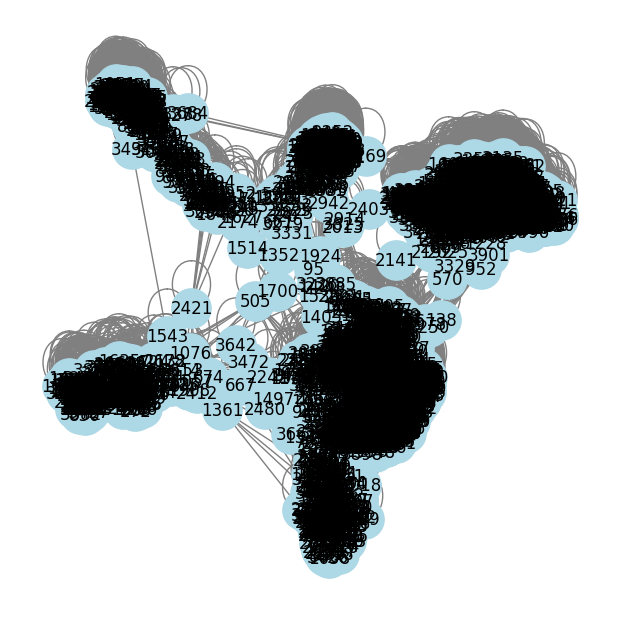

---------------------------------------------


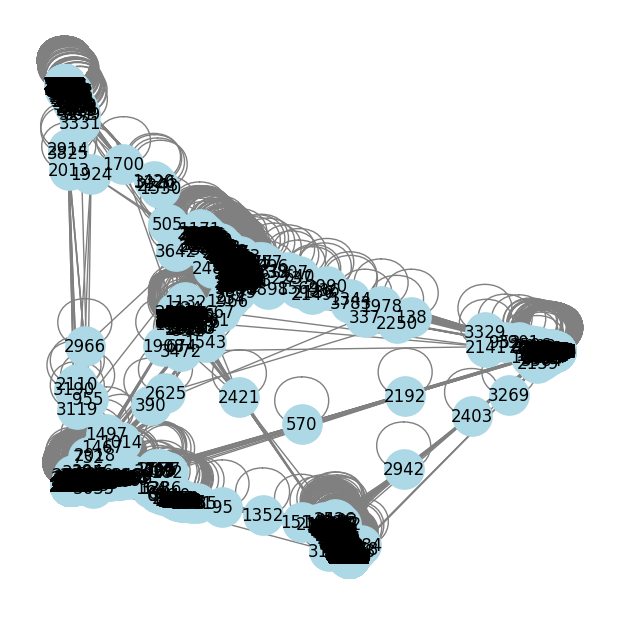

In [ ]:
draw_knn('Quake_10x_Limb_Muscle.h5', 6)

Reading data!
There are 3909 cells, 23341 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  3909
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.54975045 0.79793086 0.86456692 ... 0.29354588 0.59195092 0.48205144]
Length of Pearson distance before squareform:  7638186
Pearson distance matrix:  [[0.         0.54975045 0.79793086 ... 0.77348003 0.65059814 0.65803576]
 [0.54975045 0.         0.73198188 ... 0.76949682 0.71951682 0.68347873]
 [0.79793086 0.73198188 0.         ... 0.70871336 0.68137093 0.66922538]
 ...
 [0.77348003 0.76949682 0.70871336 ... 0.         0.29354588 0.59195092]
 [0.65059814 0.71951682 0.68137093 ... 0.29354588 0.         0.48205144]
 [0.65803576 0.68347873 0.66922538 ... 0.59195092 0.48205144 0.        ]]
Pearson distance matrix dimensions:  (3909, 3909)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 3909 nodes and 49893 edges


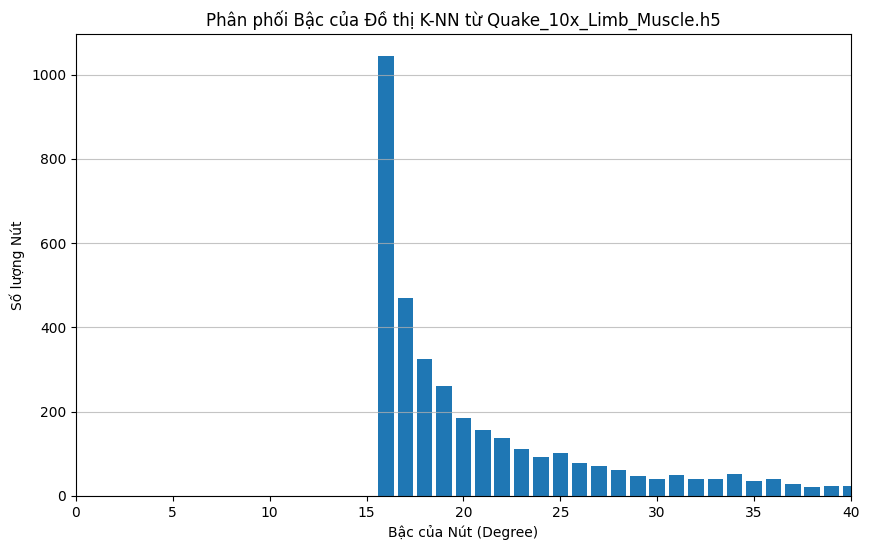

Hệ số phân cụm của đồ thị K-NN từ Quake_10x_Limb_Muscle.h5: 0.3689443581405201
Số lượng thành phần liên thông trong đồ thị K-NN từ Quake_10x_Limb_Muscle.h5: 1
Số lượng cầu nối trong đồ thị K-NN từ Quake_10x_Limb_Muscle.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Quake_10x_Limb_Muscle.h5: 0


In [ ]:
analyze_knn_structure('Quake_10x_Limb_Muscle.h5', 6)

In [83]:
# Quake_10x_Limb_Muscle.h5
!python run.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --learning_rate 0.0005 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:54:04.928696: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760986444.948529   72279 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [84]:
# Quake_10x_Limb_Muscle.h5
!python run.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --learning_rate 0.0005 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:58:26.007233: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760986706.041370   73418 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [85]:
# Quake_10x_Limb_Muscle.h5
!python run.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --learning_rate 0.0005 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 19:02:36.873549: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760986956.892958   74502 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [86]:
# Quake_10x_Limb_Muscle.h5
!python run.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --learning_rate 0.0005 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 19:06:48.352780: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760987208.372058   75588 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [87]:
# Quake_10x_Limb_Muscle.h5
!python run.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --learning_rate 0.0005 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 19:11:01.931564: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760987461.951467   76670 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [92]:
# Quake_10x_Limb_Muscle.h5
!python scAGCL.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 19:20:21.336764: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760988021.368614   79096 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Limb_Muscle.h5
!python scAGCL.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 19:23:59.673756: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760988239.693601   80036 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Quake_10x_Limb_Muscle.h5
!python scAGCL.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
# Quake_10x_Limb_Muscle.h5
!python scAGCL.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
# Quake_10x_Limb_Muscle.h5
!python scAGCL.py --data_file Quake_10x_Limb_Muscle.h5 --num_cluster 6 --lam 1 --random_seed 12345 --num_epochs 500

### Pollen

Reading data!
There are 301 cells, 21721 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  301
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.28475569 0.28711715 0.25659598 ... 0.70332107 0.74854718 0.7239533 ]
Length of Pearson distance before squareform:  45150
Pearson distance matrix:  [[0.         0.28475569 0.28711715 ... 0.85063677 0.82595558 0.80236649]
 [0.28475569 0.         0.31744796 ... 0.86705086 0.80237306 0.82238384]
 [0.28711715 0.31744796 0.         ... 0.82475131 0.79063889 0.77815755]
 ...
 [0.85063677 0.86705086 0.82475131 ... 0.         0.70332107 0.74854718]
 [0.82595558 0.80237306 0.79063889 ... 0.70332107 0.         0.7239533 ]
 [0.80236649 0.82238384 0.77815755 ... 0.74854718 0.7239533  0.        ]]
Pearson distance matrix dimensions:  (301, 301)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 301 nodes and 1323 edges


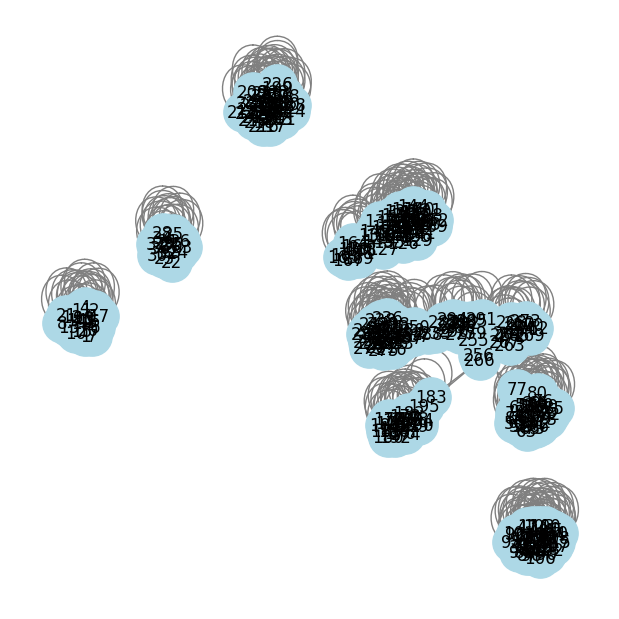

---------------------------------------------


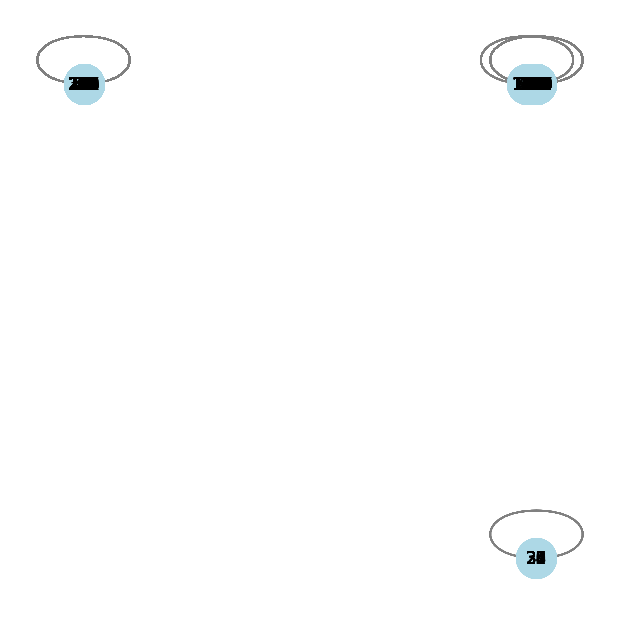

In [ ]:
draw_knn('Pollen.h5', 11)

Reading data!
There are 301 cells, 21721 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  301
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.28475569 0.28711715 0.25659598 ... 0.70332107 0.74854718 0.7239533 ]
Length of Pearson distance before squareform:  45150
Pearson distance matrix:  [[0.         0.28475569 0.28711715 ... 0.85063677 0.82595558 0.80236649]
 [0.28475569 0.         0.31744796 ... 0.86705086 0.80237306 0.82238384]
 [0.28711715 0.31744796 0.         ... 0.82475131 0.79063889 0.77815755]
 ...
 [0.85063677 0.86705086 0.82475131 ... 0.         0.70332107 0.74854718]
 [0.82595558 0.80237306 0.79063889 ... 0.70332107 0.         0.7239533 ]
 [0.80236649 0.82238384 0.77815755 ... 0.74854718 0.7239533  0.        ]]
Pearson distance matrix dimensions:  (301, 301)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 301 nodes and 1323 edges


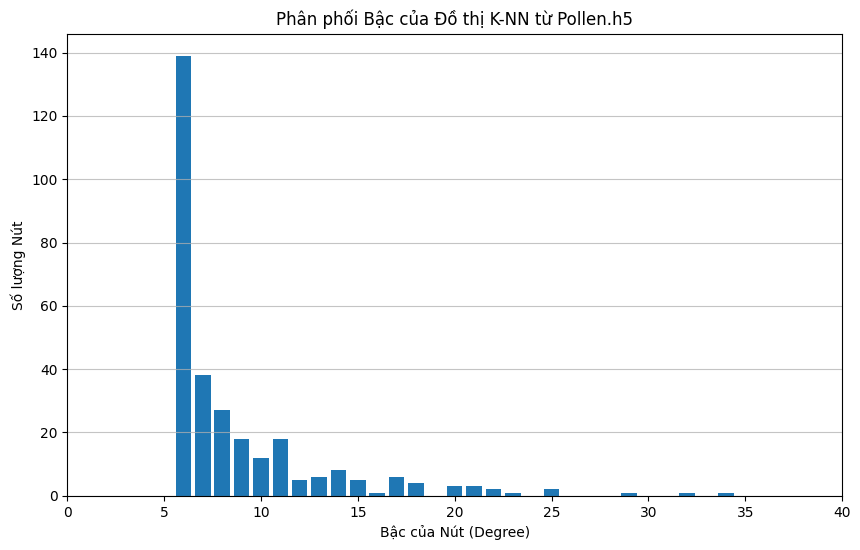

Hệ số phân cụm của đồ thị K-NN từ Pollen.h5: 0.4469015548170531
Số lượng thành phần liên thông trong đồ thị K-NN từ Pollen.h5: 6
Số lượng cầu nối trong đồ thị K-NN từ Pollen.h5: 1
Số lượng điểm cắt trong đồ thị K-NN từ Pollen.h5: 3


In [ ]:
analyze_knn_structure('Pollen.h5', 11)

In [73]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1.0 --learning_rate 0.0005 --random_seed 1 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:16:33.714923: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984193.734699   62495 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [74]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1.0 --learning_rate 0.0005 --random_seed 12 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:19:21.408861: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984361.428999   63232 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [75]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1.0 --learning_rate 0.0005 --random_seed 123 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:21:59.585939: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984519.605456   63922 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [76]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1.0 --learning_rate 0.0005 --random_seed 1234 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:24:36.224371: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984676.244482   64613 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [77]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1.0 --learning_rate 0.0005 --random_seed 12345 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:27:13.729407: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984833.749226   65297 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [78]:
# Pollen
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 1 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:29:50.938522: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760984990.959460   65991 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [79]:
# Pollen
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 12 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:32:01.406552: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760985121.427936   66563 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [80]:
# Pollen
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 123 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:34:13.169615: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760985253.189023   67138 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [81]:
# Pollen
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 1234 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:36:24.007058: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760985384.026462   67710 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [82]:
# Pollen
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 500
# n_heads = 4, drop_prob = 0.6

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 18:38:35.043194: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760985515.063140   68290 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# Pollen
# PCA-init 30
!python scAGCL.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 100

Reading data!
There are 301 cells, 21721 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  301
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.28475569 0.28711715 0.25659598 ... 0.70332107 0.74854718 0.7239533 ]
Length of Pearson distance before squareform:  45150
Pearson distance matrix:  [[0.         0.28475569 0.28711715 ... 0.85063677 0.82595559 0.80236649]
 [0.28475569 0.         0.31744796 ... 0.86705086 0.80237307 0.82238384]
 [0.28711715 0.31744796 0.         ... 0.82475131 0.79063889 0.77815755]
 ...
 [0.85063677 0.86705086 0.82475131 ... 0.         0.70332107 0.74854718]
 [0.82595559 0.80237307 0.79063889 ... 0.70332107 0.         0.7239533 ]
 [0.80236649 0.82238384 0.77815755 ... 0.74854718 0.7239533  0.        ]]
Pearson distance matrix dimensions:  (301, 301)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 301 nodes and 1323 edges
Sử dụng khởi tạo bằng PCA cho PGD
Sử dụng khởi tạo bằng 

### Yan

Reading data!
There are 90 cells, 20214 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  90
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.01277268 0.01467815 0.04871132 ... 0.25892728 0.25649018 0.22845679]
Length of Pearson distance before squareform:  4005
Pearson distance matrix:  [[0.         0.01277268 0.01467815 ... 0.84827878 0.8582129  0.82084878]
 [0.01277268 0.         0.00870639 ... 0.84766642 0.85683043 0.81992545]
 [0.01467815 0.00870639 0.         ... 0.85036049 0.85495216 0.81849056]
 ...
 [0.84827878 0.84766642 0.85036049 ... 0.         0.25892728 0.25649018]
 [0.8582129  0.85683043 0.85495216 ... 0.25892728 0.         0.22845679]
 [0.82084878 0.81992545 0.81849056 ... 0.25649018 0.22845679 0.        ]]
Pearson distance matrix dimensions:  (90, 90)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 90 nodes and 345 edges


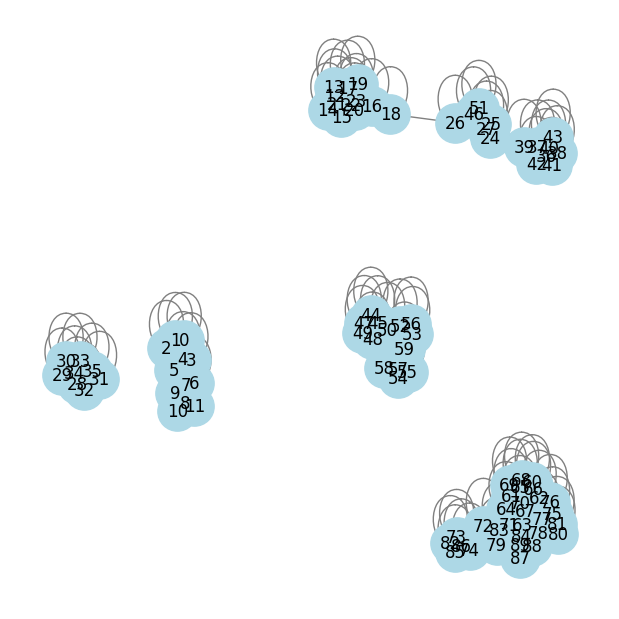

---------------------------------------------


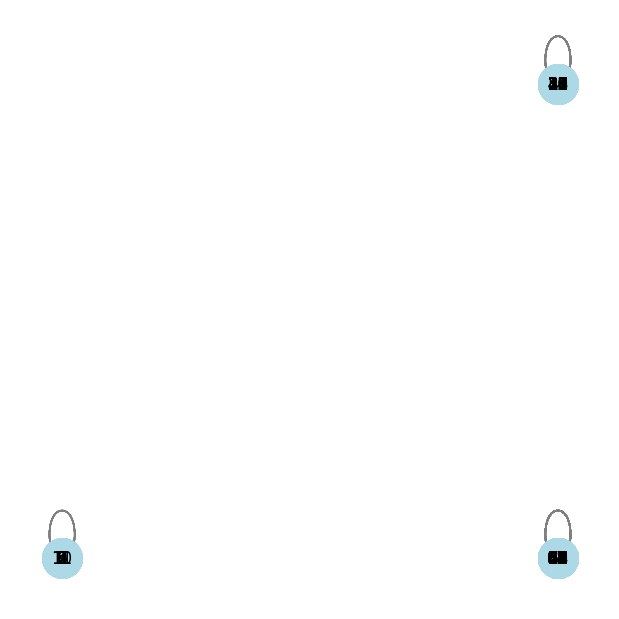

In [ ]:
draw_knn('yan.h5', 7)

Reading data!
There are 90 cells, 20214 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  90
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.01277268 0.01467815 0.04871132 ... 0.25892728 0.25649018 0.22845679]
Length of Pearson distance before squareform:  4005
Pearson distance matrix:  [[0.         0.01277268 0.01467815 ... 0.84827878 0.8582129  0.82084878]
 [0.01277268 0.         0.00870639 ... 0.84766642 0.85683043 0.81992545]
 [0.01467815 0.00870639 0.         ... 0.85036049 0.85495216 0.81849056]
 ...
 [0.84827878 0.84766642 0.85036049 ... 0.         0.25892728 0.25649018]
 [0.8582129  0.85683043 0.85495216 ... 0.25892728 0.         0.22845679]
 [0.82084878 0.81992545 0.81849056 ... 0.25649018 0.22845679 0.        ]]
Pearson distance matrix dimensions:  (90, 90)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 90 nodes and 345 edges


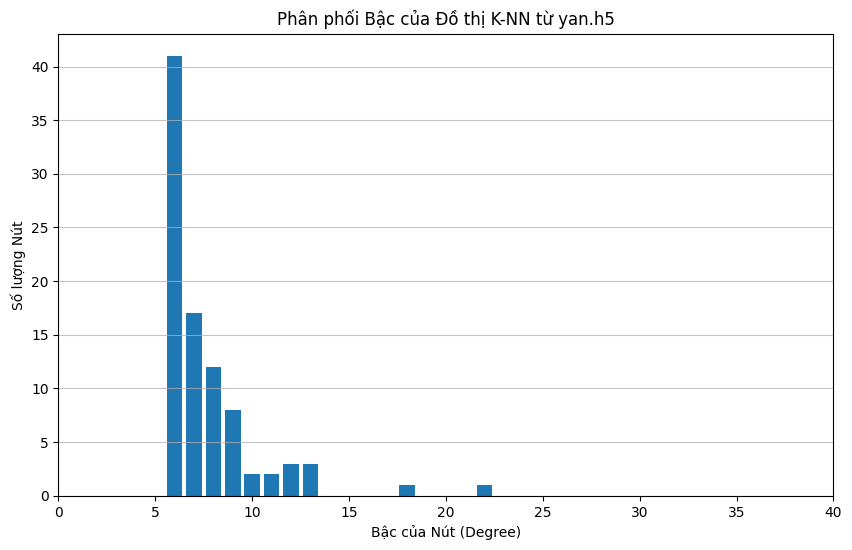

Hệ số phân cụm của đồ thị K-NN từ yan.h5: 0.7296682995367206
Số lượng thành phần liên thông trong đồ thị K-NN từ yan.h5: 5
Số lượng cầu nối trong đồ thị K-NN từ yan.h5: 1
Số lượng điểm cắt trong đồ thị K-NN từ yan.h5: 3


In [ ]:
analyze_knn_structure('yan.h5', 7)

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 09:59:17.377607: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760954357.397453   20515 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:01:51.704180: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760954511.723746   21189 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:04:22.343685: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760954662.375977   21857 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:06:56.274673: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760954816.294175   22528 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:09:29.914942: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760954969.934601   23204 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-17 09:54:48.075453: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760694888.094456   17278 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
# yan
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 12 --num_epochs 500

2025-10-16 03:54:12.638139: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760586852.657994    9005 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760586852.664088    9005 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760586852.679858    9005 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760586852.679889    9005 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760586852.679893    9005 computation_placer.cc:177] computation placer alr

In [ ]:
# yan
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 123 --num_epochs 500

2025-10-16 03:56:16.136391: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760586976.156239    9543 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760586976.162139    9543 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760586976.177231    9543 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760586976.177257    9543 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760586976.177262    9543 computation_placer.cc:177] computation placer alr

In [ ]:
# yan
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 1234 --num_epochs 500

2025-10-16 03:58:21.973449: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760587102.006538   10096 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760587102.016550   10096 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760587102.039862   10096 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760587102.039896   10096 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760587102.039904   10096 computation_placer.cc:177] computation placer alr

In [ ]:
# yan
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 12345 --num_epochs 500

2025-10-16 04:00:27.542842: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760587227.563915   10644 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760587227.569868   10644 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760587227.584993   10644 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760587227.585017   10644 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760587227.585021   10644 computation_placer.cc:177] computation placer alr

In [ ]:
# yan
# PCA-init 30
!python scAGCL.py --data_file yan.h5 --num_cluster 7 --lam 1 --random_seed 12345 --num_epochs 100

Reading data!
There are 90 cells, 20214 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  90
Number of neighbors (k) in k-nn graph:  5
Pearson distance before squareform:  [0.01277268 0.01467815 0.04871132 ... 0.25892728 0.25649018 0.22845679]
Length of Pearson distance before squareform:  4005
Pearson distance matrix:  [[0.         0.01277268 0.01467815 ... 0.84827878 0.8582129  0.82084878]
 [0.01277268 0.         0.00870639 ... 0.84766642 0.85683043 0.81992546]
 [0.01467815 0.00870639 0.         ... 0.85036049 0.85495215 0.81849056]
 ...
 [0.84827878 0.84766642 0.85036049 ... 0.         0.25892728 0.25649018]
 [0.8582129  0.85683043 0.85495215 ... 0.25892728 0.         0.22845679]
 [0.82084878 0.81992546 0.81849056 ... 0.25649018 0.22845679 0.        ]]
Pearson distance matrix dimensions:  (90, 90)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 90 nodes and 345 edges
Sử dụng khởi tạo bằng PCA cho PGD
Sử dụng khởi tạo bằng PCA cho

### Worm_neuron_cell

Reading data!
There are 4186 cells, 13488 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4186
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [1.00701394 0.96761315 0.92454294 ... 0.81562923 0.84348968 0.70799471]
Length of Pearson distance before squareform:  8759205
Pearson distance matrix:  [[0.         1.00701394 0.96761315 ... 1.0063654  1.00822862 1.00864954]
 [1.00701394 0.         1.00569616 ... 1.00526522 1.0068064  1.00715457]
 [0.96761315 1.00569616 0.         ... 1.00516947 1.00668263 1.00702447]
 ...
 [1.0063654  1.00526522 1.00516947 ... 0.         0.81562923 0.84348968]
 [1.00822862 1.0068064  1.00668263 ... 0.81562923 0.         0.70799471]
 [1.00864954 1.00715457 1.00702447 ... 0.84348968 0.70799471 0.        ]]
Pearson distance matrix dimensions:  (4186, 4186)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4186 nodes and 52708 edges


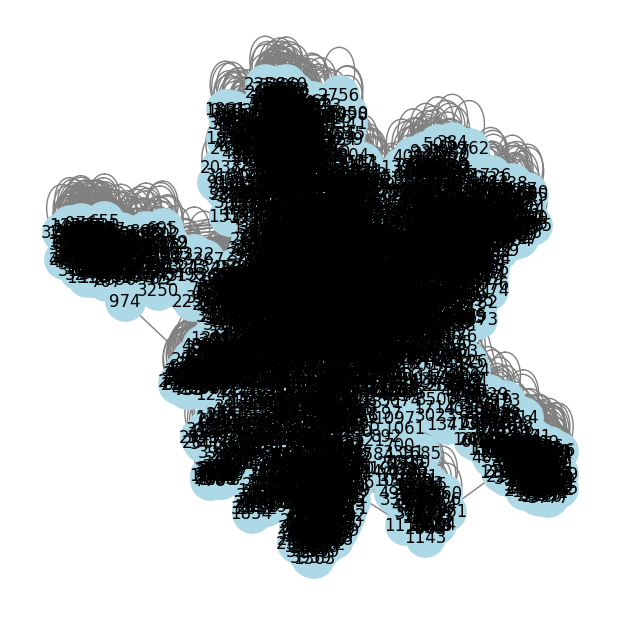

---------------------------------------------


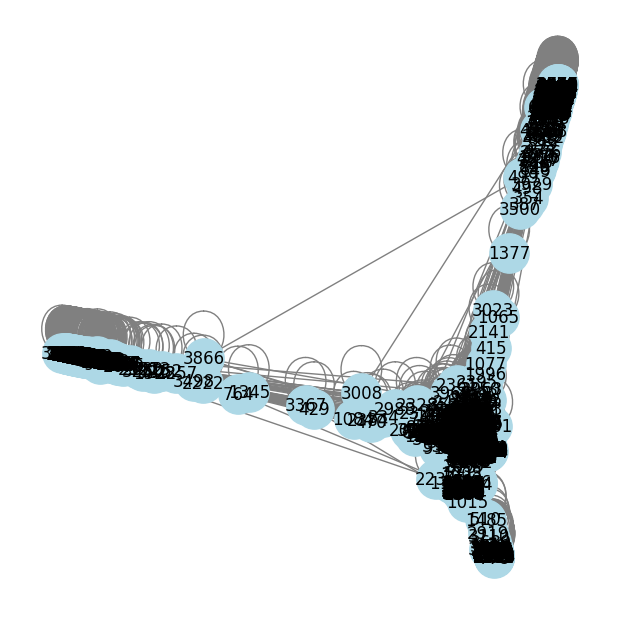

In [ ]:
draw_knn('worm_neuron_cell.h5', 10)

Reading data!
There are 4186 cells, 13488 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4186
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [1.00701394 0.96761315 0.92454294 ... 0.81562923 0.84348968 0.70799471]
Length of Pearson distance before squareform:  8759205
Pearson distance matrix:  [[0.         1.00701394 0.96761315 ... 1.0063654  1.00822862 1.00864954]
 [1.00701394 0.         1.00569616 ... 1.00526522 1.0068064  1.00715457]
 [0.96761315 1.00569616 0.         ... 1.00516947 1.00668263 1.00702447]
 ...
 [1.0063654  1.00526522 1.00516947 ... 0.         0.81562923 0.84348968]
 [1.00822862 1.0068064  1.00668263 ... 0.81562923 0.         0.70799471]
 [1.00864954 1.00715457 1.00702447 ... 0.84348968 0.70799471 0.        ]]
Pearson distance matrix dimensions:  (4186, 4186)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4186 nodes and 52708 edges


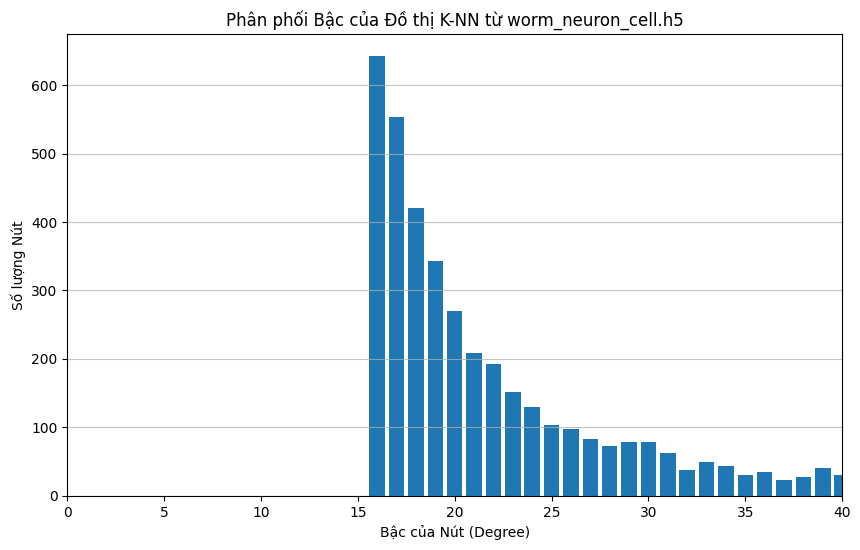

Hệ số phân cụm của đồ thị K-NN từ worm_neuron_cell.h5: 0.3171486747974829
Số lượng thành phần liên thông trong đồ thị K-NN từ worm_neuron_cell.h5: 1
Số lượng cầu nối trong đồ thị K-NN từ worm_neuron_cell.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ worm_neuron_cell.h5: 0


In [ ]:
analyze_knn_structure('worm_neuron_cell.h5', 10)

In [ ]:
# worm_neuron_cell
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 1 --num_epochs 100

# ARI NMI
# 56 65
# 48 62
# 49 63
# 49 63
# 44 58
# AVG: 49.2 62.2

Reading data!
There are 4186 cells, 13488 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4186
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [1.00701394 0.96761315 0.92454294 ... 0.81562923 0.84348968 0.70799471]
Length of Pearson distance before squareform:  8759205
Pearson distance matrix:  [[0.         1.00701394 0.96761315 ... 1.0063654  1.00822862 1.00864954]
 [1.00701394 0.         1.00569616 ... 1.00526522 1.0068064  1.00715457]
 [0.96761315 1.00569616 0.         ... 1.00516947 1.00668263 1.00702447]
 ...
 [1.0063654  1.00526522 1.00516947 ... 0.         0.81562923 0.84348968]
 [1.00822862 1.0068064  1.00668263 ... 0.81562923 0.         0.70799471]
 [1.00864954 1.00715457 1.00702447 ... 0.84348968 0.70799471 0.        ]]
Pearson distance matrix dimensions:  (4186, 4186)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4186 nodes and 52708 edges
Epoch=020, loss1=6.2721, loss2=5.8951, total lo

In [ ]:
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 1 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 10:54:23.665843: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760957663.697701   34894 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 12 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 11:33:36.100667: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760960016.120255   44664 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 123 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 11:38:41.617336: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760960321.638565   45962 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 1234 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 11:43:49.923531: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760960629.943131   47292 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 12345 --num_epochs 500

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
2025-10-20 11:59:26.274117: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760961566.293906   51221 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin

In [ ]:
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 1234 --num_epochs 500

2025-10-16 05:18:59.886792: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760591939.906588   30498 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760591939.912614   30498 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760591939.927730   30498 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760591939.927752   30498 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760591939.927756   30498 computation_placer.cc:177] computation placer alr

In [ ]:
!python scAGCL.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --random_seed 12345 --num_epochs 500

2025-10-16 05:22:34.571271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760592154.592701   31389 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760592154.598733   31389 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760592154.613841   31389 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760592154.613867   31389 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760592154.613871   31389 computation_placer.cc:177] computation placer alr

### Melanoma_5K

Reading data!
There are 4513 cells, 23684 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4513
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.7720349  0.80200403 0.89170067 ... 0.6123498  0.42360326 0.54887316]
Length of Pearson distance before squareform:  10181328
Pearson distance matrix:  [[0.         0.7720349  0.80200403 ... 0.74181494 0.72298412 0.75968301]
 [0.7720349  0.         0.79577423 ... 0.5044285  0.68000725 0.52662251]
 [0.80200403 0.79577423 0.         ... 0.76398917 0.83631827 0.72088228]
 ...
 [0.74181494 0.5044285  0.76398917 ... 0.         0.6123498  0.42360326]
 [0.72298412 0.68000725 0.83631827 ... 0.6123498  0.         0.54887316]
 [0.75968301 0.52662251 0.72088228 ... 0.42360326 0.54887316 0.        ]]
Pearson distance matrix dimensions:  (4513, 4513)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4513 nodes and 57699 edges


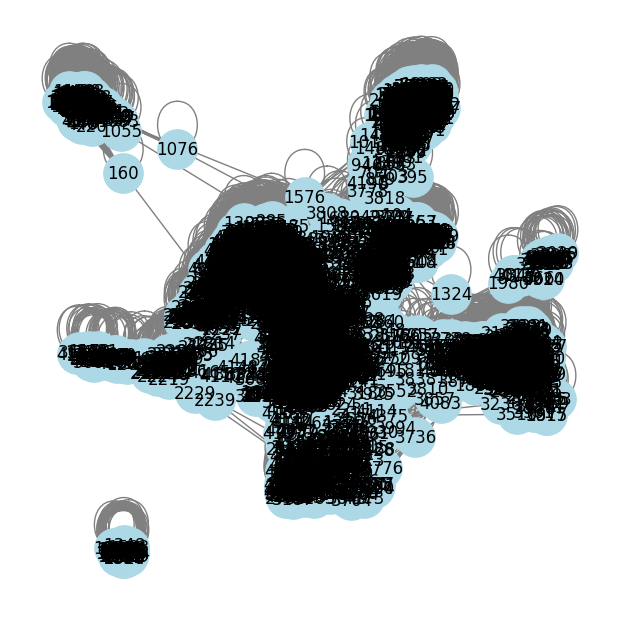

---------------------------------------------


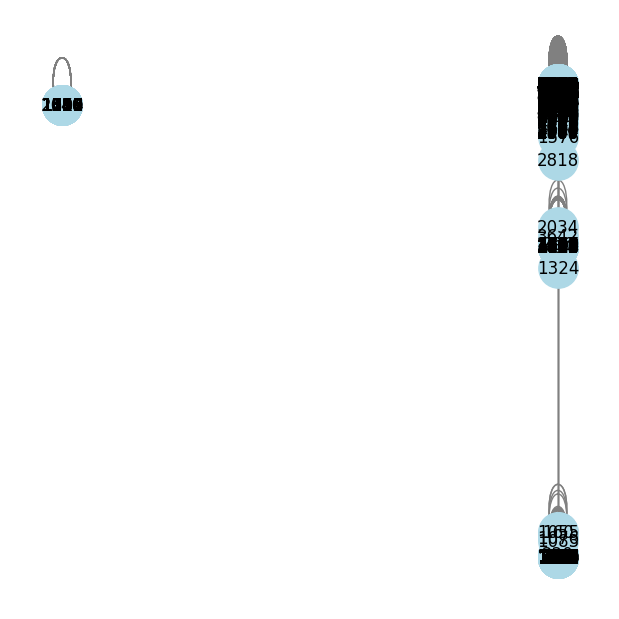

In [ ]:
draw_knn('Melanoma_5K.h5', 9)

Reading data!
There are 4513 cells, 23684 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4513
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.7720349  0.80200403 0.89170067 ... 0.6123498  0.42360326 0.54887316]
Length of Pearson distance before squareform:  10181328
Pearson distance matrix:  [[0.         0.7720349  0.80200403 ... 0.74181494 0.72298412 0.75968301]
 [0.7720349  0.         0.79577423 ... 0.5044285  0.68000725 0.52662251]
 [0.80200403 0.79577423 0.         ... 0.76398917 0.83631827 0.72088228]
 ...
 [0.74181494 0.5044285  0.76398917 ... 0.         0.6123498  0.42360326]
 [0.72298412 0.68000725 0.83631827 ... 0.6123498  0.         0.54887316]
 [0.75968301 0.52662251 0.72088228 ... 0.42360326 0.54887316 0.        ]]
Pearson distance matrix dimensions:  (4513, 4513)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4513 nodes and 57699 edges


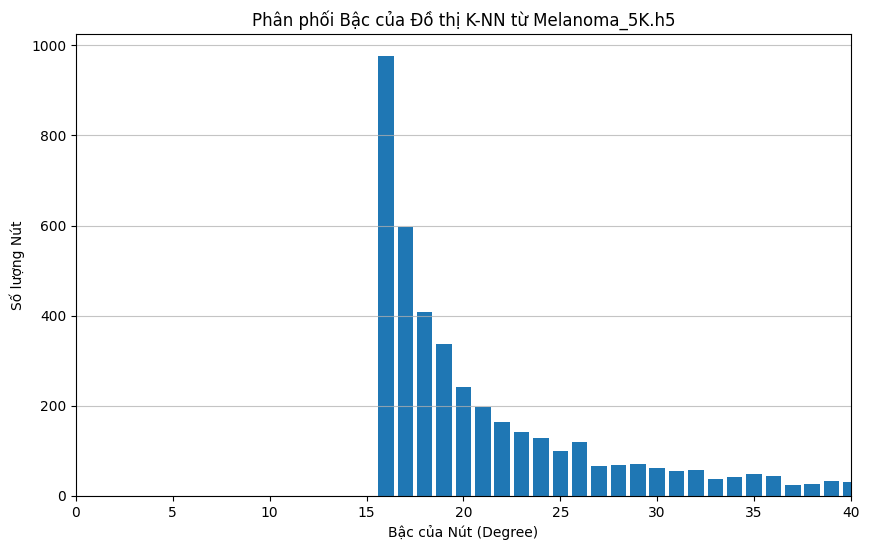

Hệ số phân cụm của đồ thị K-NN từ Melanoma_5K.h5: 0.3013217574315283
Số lượng thành phần liên thông trong đồ thị K-NN từ Melanoma_5K.h5: 2
Số lượng cầu nối trong đồ thị K-NN từ Melanoma_5K.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Melanoma_5K.h5: 0


In [ ]:
analyze_knn_structure('Melanoma_5K.h5', 9)

In [ ]:
# Melanoma_5K
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 12345 --num_epochs 100

# ARI NMI
# 68 70
# 61 69
# 70 71
# 69 71
# 61 69

Reading data!
There are 4513 cells, 23684 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4513
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.7720349  0.80200403 0.89170067 ... 0.6123498  0.42360326 0.54887316]
Length of Pearson distance before squareform:  10181328
Pearson distance matrix:  [[0.         0.7720349  0.80200403 ... 0.74181494 0.72298412 0.75968301]
 [0.7720349  0.         0.79577423 ... 0.5044285  0.68000725 0.52662251]
 [0.80200403 0.79577423 0.         ... 0.76398917 0.83631827 0.72088228]
 ...
 [0.74181494 0.5044285  0.76398917 ... 0.         0.6123498  0.42360326]
 [0.72298412 0.68000725 0.83631827 ... 0.6123498  0.         0.54887316]
 [0.75968301 0.52662251 0.72088228 ... 0.42360326 0.54887316 0.        ]]
Pearson distance matrix dimensions:  (4513, 4513)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4513 nodes and 57699 edges
Epoch=020, loss1=6.0700, loss2=6.3335, total l

In [ ]:
# Melanoma_5K
# PCA-init 40
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 1 --num_epochs 100

Reading data!
There are 4513 cells, 23684 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  4513
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.7720349  0.80200403 0.89170067 ... 0.6123498  0.42360326 0.54887316]
Length of Pearson distance before squareform:  10181328
Pearson distance matrix:  [[0.         0.7720349  0.80200403 ... 0.74181494 0.72298412 0.75968301]
 [0.7720349  0.         0.79577423 ... 0.5044285  0.68000725 0.52662251]
 [0.80200403 0.79577423 0.         ... 0.76398917 0.83631826 0.72088228]
 ...
 [0.74181494 0.5044285  0.76398917 ... 0.         0.6123498  0.42360326]
 [0.72298412 0.68000725 0.83631826 ... 0.6123498  0.         0.54887316]
 [0.75968301 0.52662251 0.72088228 ... 0.42360326 0.54887316 0.        ]]
Pearson distance matrix dimensions:  (4513, 4513)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 4513 nodes and 57699 edges
Sử dụng khởi tạo bằng PCA cho PGD
Sử dụng khởi

In [ ]:
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 12345 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --random_seed 12345 --num_epochs 500

### Muraro

Reading data!
There are 2122 cells, 19046 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  2122
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.70152275 0.19884827 0.30764811 ... 0.85071749 0.69899557 0.77094056]
Length of Pearson distance before squareform:  2250381
Pearson distance matrix:  [[0.         0.70152275 0.19884827 ... 0.85342242 0.34326243 0.71139879]
 [0.70152275 0.         0.7282964  ... 0.76951329 0.80342796 0.30100223]
 [0.19884827 0.7282964  0.         ... 0.84917896 0.34331459 0.72231791]
 ...
 [0.85342242 0.76951329 0.84917896 ... 0.         0.85071749 0.69899557]
 [0.34326243 0.80342796 0.34331459 ... 0.85071749 0.         0.77094056]
 [0.71139879 0.30100223 0.72231791 ... 0.69899557 0.77094056 0.        ]]
Pearson distance matrix dimensions:  (2122, 2122)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2122 nodes and 28474 edges


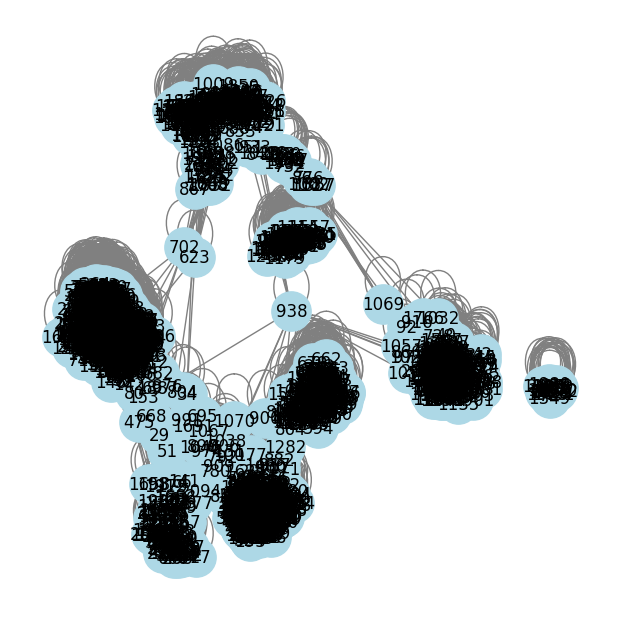

---------------------------------------------


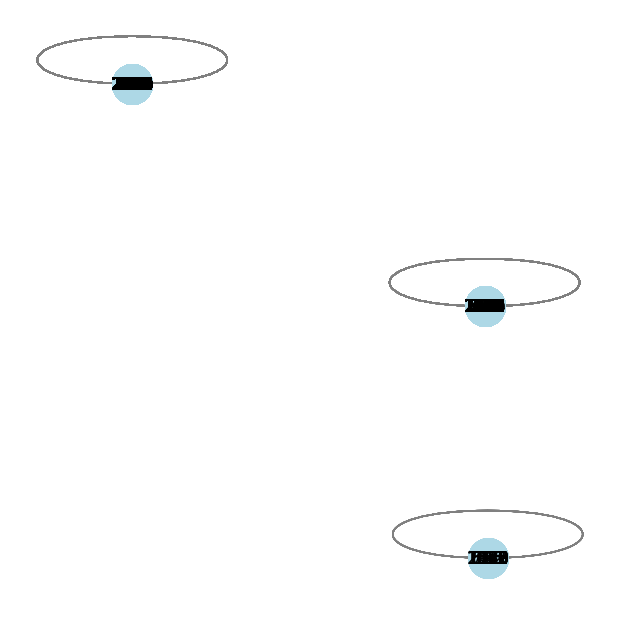

In [ ]:
draw_knn('Muraro.h5', 9)

Reading data!
There are 2122 cells, 19046 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  2122
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.70152275 0.19884827 0.30764811 ... 0.85071749 0.69899557 0.77094056]
Length of Pearson distance before squareform:  2250381
Pearson distance matrix:  [[0.         0.70152275 0.19884827 ... 0.85342242 0.34326243 0.71139879]
 [0.70152275 0.         0.7282964  ... 0.76951329 0.80342796 0.30100223]
 [0.19884827 0.7282964  0.         ... 0.84917896 0.34331459 0.72231791]
 ...
 [0.85342242 0.76951329 0.84917896 ... 0.         0.85071749 0.69899557]
 [0.34326243 0.80342796 0.34331459 ... 0.85071749 0.         0.77094056]
 [0.71139879 0.30100223 0.72231791 ... 0.69899557 0.77094056 0.        ]]
Pearson distance matrix dimensions:  (2122, 2122)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2122 nodes and 28474 edges


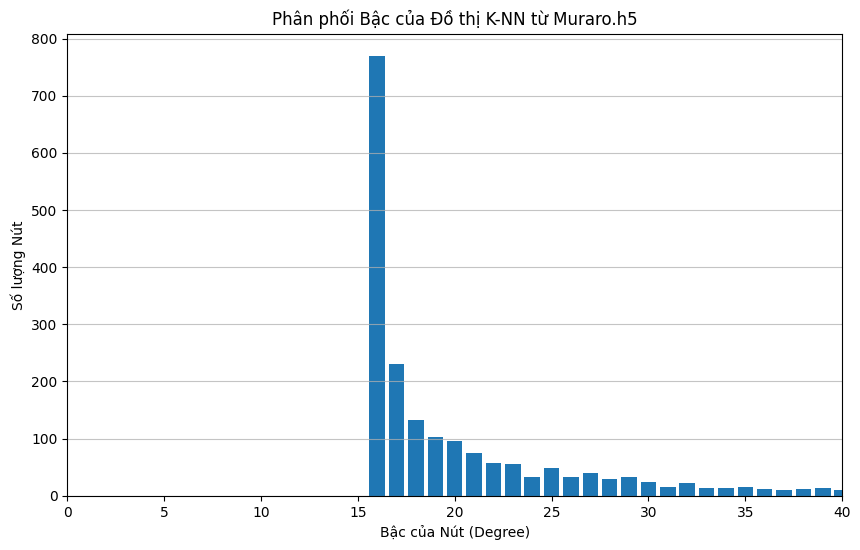

Hệ số phân cụm của đồ thị K-NN từ Muraro.h5: 0.49525543719263054
Số lượng thành phần liên thông trong đồ thị K-NN từ Muraro.h5: 3
Số lượng cầu nối trong đồ thị K-NN từ Muraro.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Muraro.h5: 0


In [ ]:
analyze_knn_structure('Muraro.h5', 9)

In [ ]:
# Muraro.h5
!python scAGCL.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 12345 --num_epochs 100

Reading data!
There are 2122 cells, 19046 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  2122
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.70152275 0.19884827 0.30764811 ... 0.85071749 0.69899557 0.77094056]
Length of Pearson distance before squareform:  2250381
Pearson distance matrix:  [[0.         0.70152275 0.19884827 ... 0.85342242 0.34326243 0.71139879]
 [0.70152275 0.         0.7282964  ... 0.76951329 0.80342796 0.30100223]
 [0.19884827 0.7282964  0.         ... 0.84917896 0.34331459 0.72231791]
 ...
 [0.85342242 0.76951329 0.84917896 ... 0.         0.85071749 0.69899557]
 [0.34326243 0.80342796 0.34331459 ... 0.85071749 0.         0.77094056]
 [0.71139879 0.30100223 0.72231791 ... 0.69899557 0.77094056 0.        ]]
Pearson distance matrix dimensions:  (2122, 2122)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 2122 nodes and 28474 edges
Epoch=020, loss1=6.1110, loss2=7.2099, total lo

In [ ]:
# Muraro.h5
!python run.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
# Muraro.h5
!python run.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
# Muraro.h5
!python run.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
# Muraro.h5
!python run.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
# Muraro.h5
!python run.py --data_file Muraro.h5 --num_cluster 9 --lam 1 --random_seed 12345 --num_epochs 500

### Petropoulos

Reading data!
There are 1529 cells, 21748 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  1529
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.21649687 0.2921668  0.39985483 ... 0.34285403 0.46377785 0.26187937]
Length of Pearson distance before squareform:  1168156
Pearson distance matrix:  [[0.         0.21649687 0.2921668  ... 0.46792963 0.20943865 0.2968014 ]
 [0.21649687 0.         0.21104858 ... 0.33811958 0.12945988 0.27387967]
 [0.2921668  0.21104858 0.         ... 0.37834436 0.18567264 0.26073633]
 ...
 [0.46792963 0.33811958 0.37834436 ... 0.         0.34285403 0.46377785]
 [0.20943865 0.12945988 0.18567264 ... 0.34285403 0.         0.26187937]
 [0.2968014  0.27387967 0.26073633 ... 0.46377785 0.26187937 0.        ]]
Pearson distance matrix dimensions:  (1529, 1529)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 1529 nodes and 19387 edges


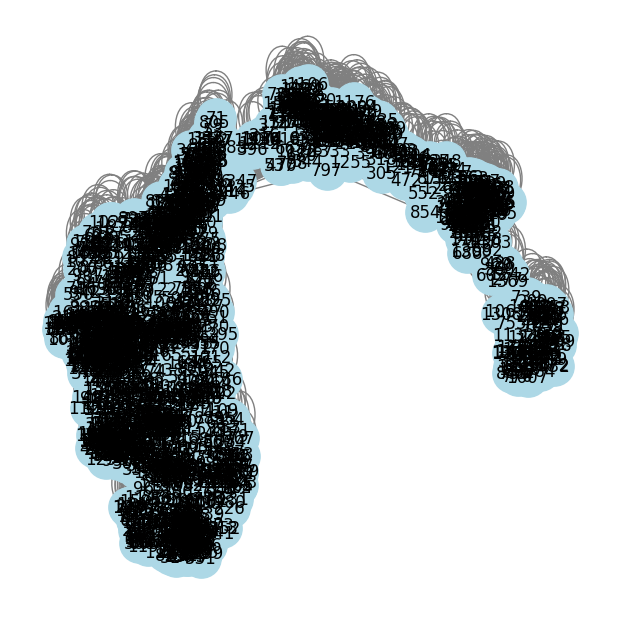

---------------------------------------------


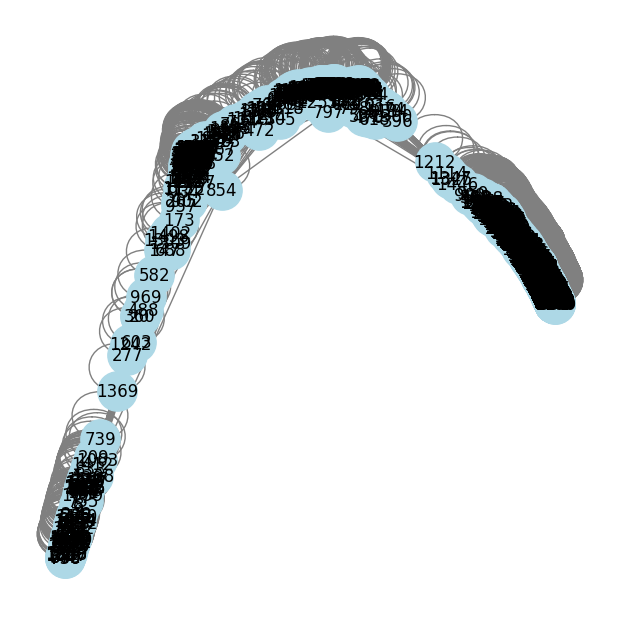

In [ ]:
draw_knn('petropoulos.h5', 5)

Reading data!
There are 1529 cells, 21748 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  1529
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.21649687 0.2921668  0.39985483 ... 0.34285403 0.46377785 0.26187937]
Length of Pearson distance before squareform:  1168156
Pearson distance matrix:  [[0.         0.21649687 0.2921668  ... 0.46792963 0.20943865 0.2968014 ]
 [0.21649687 0.         0.21104858 ... 0.33811958 0.12945988 0.27387967]
 [0.2921668  0.21104858 0.         ... 0.37834436 0.18567264 0.26073633]
 ...
 [0.46792963 0.33811958 0.37834436 ... 0.         0.34285403 0.46377785]
 [0.20943865 0.12945988 0.18567264 ... 0.34285403 0.         0.26187937]
 [0.2968014  0.27387967 0.26073633 ... 0.46377785 0.26187937 0.        ]]
Pearson distance matrix dimensions:  (1529, 1529)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 1529 nodes and 19387 edges


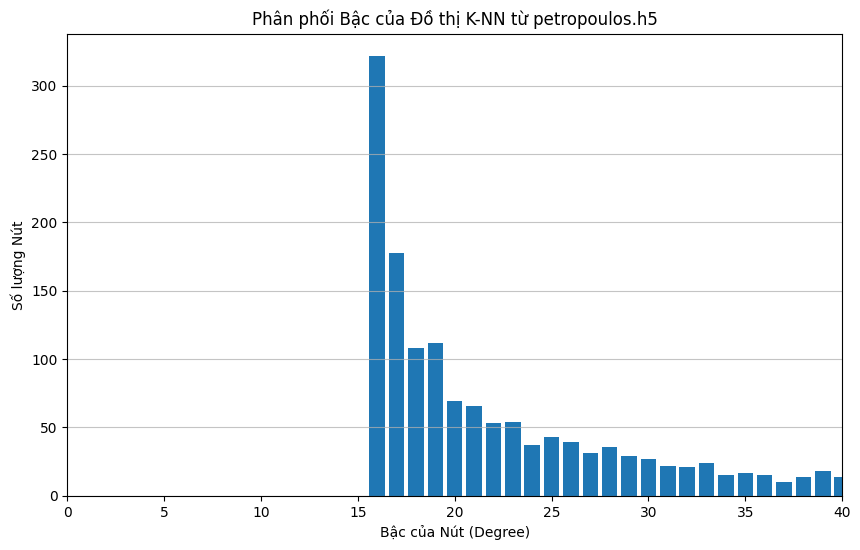

Hệ số phân cụm của đồ thị K-NN từ petropoulos.h5: 0.5354601935476758
Số lượng thành phần liên thông trong đồ thị K-NN từ petropoulos.h5: 1
Số lượng cầu nối trong đồ thị K-NN từ petropoulos.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ petropoulos.h5: 0


In [ ]:
analyze_knn_structure('petropoulos.h5', 5)

In [ ]:
# petropoulos.h5
!python scAGCL.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 100

Reading data!
There are 1529 cells, 21748 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  1529
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.21649687 0.2921668  0.39985483 ... 0.34285403 0.46377785 0.26187937]
Length of Pearson distance before squareform:  1168156
Pearson distance matrix:  [[0.         0.21649687 0.2921668  ... 0.46792963 0.20943865 0.2968014 ]
 [0.21649687 0.         0.21104858 ... 0.33811958 0.12945988 0.27387967]
 [0.2921668  0.21104858 0.         ... 0.37834436 0.18567264 0.26073633]
 ...
 [0.46792963 0.33811958 0.37834436 ... 0.         0.34285403 0.46377785]
 [0.20943865 0.12945988 0.18567264 ... 0.34285403 0.         0.26187937]
 [0.2968014  0.27387967 0.26073633 ... 0.46377785 0.26187937 0.        ]]
Pearson distance matrix dimensions:  (1529, 1529)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 1529 nodes and 19387 edges
Epoch=020, loss1=6.6709, loss2=6.6828, total lo

In [ ]:
# petropoulos.h5
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
# petropoulos.h5
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
# petropoulos.h5
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
# petropoulos.h5
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
# petropoulos.h5
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 500

### Young

In [ ]:
draw_knn('Young.h5', 11)

NameError: name 'draw_knn' is not defined

Reading data!
There are 5685 cells, 33658 genes
Data Preprocessing!
Keeping 2000 genes
Number of cells in dataset:  5685
Number of neighbors (k) in k-nn graph:  15
Pearson distance before squareform:  [0.60907223 0.63484381 0.72287375 ... 0.33906964 0.37709026 0.29066692]
Length of Pearson distance before squareform:  16156770
Pearson distance matrix:  [[0.         0.60907223 0.63484381 ... 0.83694466 0.8106103  0.83334365]
 [0.60907223 0.         0.44068989 ... 0.80822472 0.66512922 0.72466382]
 [0.63484381 0.44068989 0.         ... 0.63861151 0.55191941 0.57899064]
 ...
 [0.83694466 0.80822472 0.63861151 ... 0.         0.33906964 0.37709026]
 [0.8106103  0.66512922 0.55191941 ... 0.33906964 0.         0.29066692]
 [0.83334365 0.72466382 0.57899064 ... 0.37709026 0.29066692 0.        ]]
Pearson distance matrix dimensions:  (5685, 5685)
Start building kNN graph !!!
End building kNN graph !!!
Building a Graph with 5685 nodes and 75805 edges


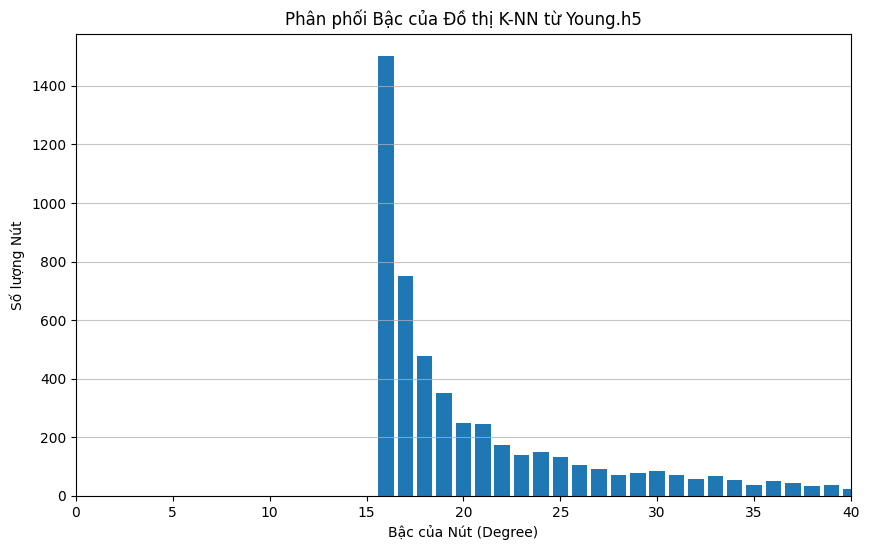

Hệ số phân cụm của đồ thị K-NN từ Young.h5: 0.4394463909151107
Số lượng thành phần liên thông trong đồ thị K-NN từ Young.h5: 1
Số lượng cầu nối trong đồ thị K-NN từ Young.h5: 0
Số lượng điểm cắt trong đồ thị K-NN từ Young.h5: 1


In [ ]:
analyze_knn_structure('Young.h5', 11)

In [ ]:
# Young.h5
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 100

2025-10-11 06:08:35.376010: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760162915.409973    1314 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760162915.419939    1314 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760162915.444885    1314 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760162915.444923    1314 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760162915.444932    1314 computation_placer.cc:177] computation placer alr

In [ ]:
# Young.h5
!python run.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 1 --num_epochs 500

2025-10-14 15:52:42.907294: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760457162.927540    4722 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760457162.933743    4722 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760457162.948985    4722 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457162.949017    4722 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457162.949021    4722 computation_placer.cc:177] computation placer alr

In [ ]:
!python run.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 12 --num_epochs 500

2025-10-14 15:57:36.934554: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760457456.954485    5943 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760457456.960690    5943 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760457456.975999    5943 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457456.976029    5943 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457456.976033    5943 computation_placer.cc:177] computation placer alr

In [ ]:
!python run.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 123 --num_epochs 500

2025-10-14 16:02:29.654937: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760457749.688568    7162 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760457749.698454    7162 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760457749.722368    7162 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457749.722408    7162 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760457749.722415    7162 computation_placer.cc:177] computation placer alr

In [ ]:
!python run.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 1234 --num_epochs 500

2025-10-14 16:07:20.016526: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760458040.036055    8396 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760458040.041870    8396 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760458040.058100    8396 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760458040.058128    8396 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760458040.058134    8396 computation_placer.cc:177] computation placer alr

In [ ]:
!python run.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 500

2025-10-14 16:12:10.189199: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760458330.222867    9626 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760458330.233629    9626 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760458330.257026    9626 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760458330.257062    9626 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760458330.257070    9626 computation_placer.cc:177] computation placer alr

In [ ]:
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 1 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 12 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 123 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 1234 --num_epochs 500

In [ ]:
!python scAGCL.py --data_file Young.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 500

# Run our methodology on dataset h5data1

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=./runs/scMGCL

In [ ]:
# goolam
!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --random_seed 12345 --num_epochs 100
# n_heads = 4, dropout_prob = 0.6

2025-10-11 16:21:05.720798: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760199665.742112    9509 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760199665.748285    9509 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760199665.764806    9509 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760199665.764841    9509 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1760199665.764848    9509 computation_placer.cc:177] computation placer alr

In [ ]:
# goolam
!python run.py --data_file goolam.h5 --num_cluster 5 --lam 1 --seed 12345 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 8, dropout_prob = 0.3

In [ ]:
# Pollen
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --random_seed 12345 --num_epochs 100
# n_heads = 4, dropout_prob = 0.6

In [ ]:
# yan
!python run.py --data_file yan.h5 --num_cluster 7 --lam 1 --seed 123 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 8, dropout_prob = 0.3

In [ ]:
# worm_neuron_cell
!python run.py --data_file worm_neuron_cell.h5 --num_cluster 10 --lam 1 --seed 12345 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 4, dropout_prob = 0.3

In [ ]:
# petropoulos
!python run.py --data_file petropoulos.h5 --num_cluster 5 --lam 1 --seed 12 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 4, dropout_prob = 0.6

In [ ]:
# Melanoma_5K
!python run.py --data_file Melanoma_5K.h5 --num_cluster 9 --lam 1 --seed 12345 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 4, dropout_prob = 0.6

In [ ]:
!python run.py --data_file Pollen.h5 --num_cluster 11 --lam 1 --seed 1 --num_epochs 100 --batch_size 32 --output_file test_result.csv
# n_heads = 8